# Tutorial 4: multi-slice analysis (DLPFC dataset)

## Data Availability  

The DLPFC dataset used in this tutorial can be accessed through multiple sources:  

- **Dataset**: The processed DLPFC data is hosted in the [spatialLIBD repository](https://github.com/LieberInstitute/spatialLIBD)  
- **Manual Annotations**: Expert-curated layer annotations are available in [supplementary data folder from STAGATE[1]](https://drive.google.com/drive/folders/10lhz5VY7YfvHrtV40MwaqLmWz56U9eBP?usp=sharing)  

## Introduction  

SEPARmult extends the original SEPAR algorithm to handle multiple tissue sections simultaneously, enabling:  
- Joint pattern discovery across sections  
- Consistent spatial domain identification  
- Cross-section gene program analysis  
- Integrated refinement of gene expression

## 2. Data Preparation  

First, let's import the necessary packages and load the data:  

In [ ]:
import pandas as pd  
import numpy as np  
import scanpy as sc  
import anndata as ad  
import matplotlib.pyplot as plt
from SEPARmult_model import SEPARmult  

# Load multiple slices  
section_ids = ['151673','151674','151675','151676']  
Batch_list = []  

# Load annotation data  
anno_df = pd.read_csv('dataset/DLPFC/barcode_level_layer_map.tsv', sep='\t', header=None)  

for section_id in section_ids:  
    # Read Visium data  
    adata = sc.read_visium(path="dataset/DLPFC/%s" % section_id,  
                          count_file="%s_filtered_feature_bc_matrix.h5" % section_id)  
    
    # Add layer annotations  
    anno_df1 = anno_df.iloc[anno_df[1].values.astype(str) == str(section_id)]  
    anno_df1.columns = ["barcode", "slice_id", "layer"]  
    anno_df1.index = anno_df1['barcode']  
    adata.obs = adata.obs.join(anno_df1, how="left")  
    
    # Filter spots with no annotation  
    adata = adata[adata.obs['layer'].notna()]  
    adata.obs['Ground Truth'] = adata.obs['layer'].astype('category')  
    
    # Make spot names unique  
    adata.obs_names = [x+'_'+section_id for x in adata.obs_names]  
    
    Batch_list.append(adata)  

# Initialize SEPARmult  
separ = SEPARmult(Batch_list, section_ids, n_cluster=7)  

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


## Data Preprocessing

SEPARmult requires several preprocessing steps to ensure data quality and compatibility across sections:

In [2]:
# Basic filtering and normalization  
separ.preprocess(min_cells=50, normalize=True)  

# Filter to keep only shared genes across sections  
separ.filter_shared_genes()  

# Compute spatial graphs for each section  
separ.compute_graph(radius_rate=1.3)  

# Select highly variable genes using Moran's I  
separ.select_morani(nslt=3000)  

# Concatenate data and compute weights  
separ.concat_data()  
separ.compute_weight(n_cluster=7)

After filtering and preprocessing: (3611, 13080)
After filtering and preprocessing: (3635, 13968)
After filtering and preprocessing: (3566, 12443)
After filtering and preprocessing: (3431, 12577)
Number of shared genes: 12264
Mean number of neighbors for sample 151673: 6.83
Mean number of neighbors for sample 151674: 6.81
Mean number of neighbors for sample 151675: 6.80
Mean number of neighbors for sample 151676: 6.82
Moran's I selection finished
Data concatenation finished


##  Running SEPARmult Algorithm  

The core algorithm integrates information across all sections to identify spatial patterns: 

In [3]:
# Run SEPARmult algorithm  
separ.separ_algorithm(  
    r=30,              # Number of spatial patterns  
    alpha=0.5,         # Graph regularization weight  
    beta=0.003,         # Sparsity penalty weight  
    gamma=0.5,          # Pattern orthogonality weight   
)  

Processing iterations: 100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


## Pattern-Specific Gene Identification

SEPARmult can identify genes specific to each spatial pattern:

In [15]:
# Identify pattern-specific genes  
pattern_genes = separ.identify_pattern_specific_genes(  
    n_patterns=30,    # Number of patterns to analyze  
    threshold=0.3      # Threshold for gene specificity  
)  



Number of SVGs identified: 1519


## Visualization of Patterns with Pattern-Specific Genes

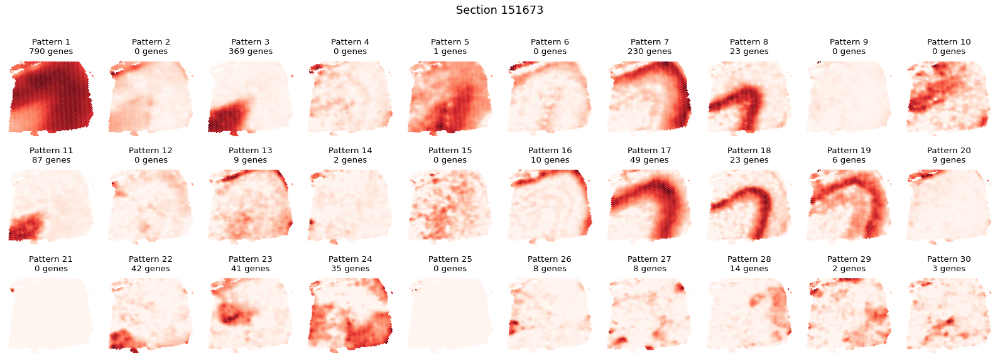

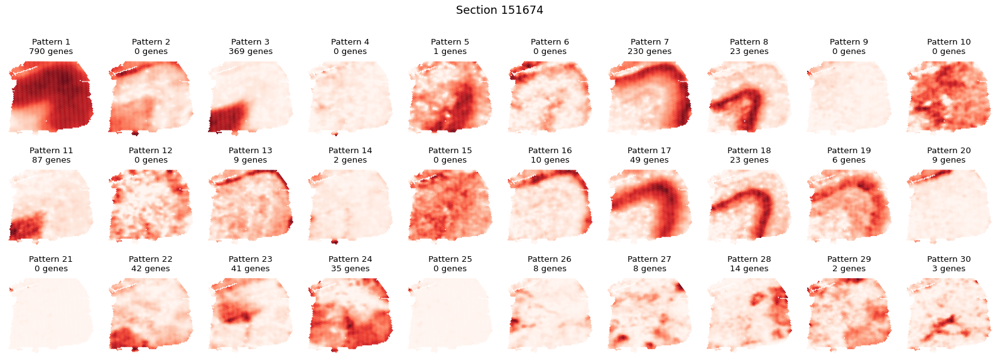

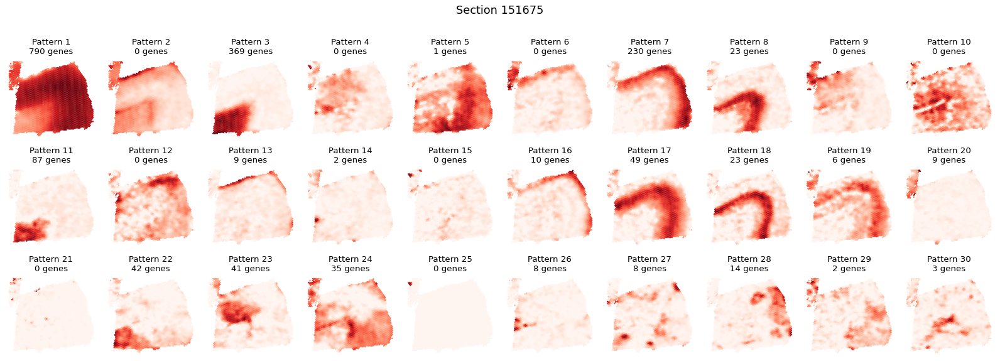

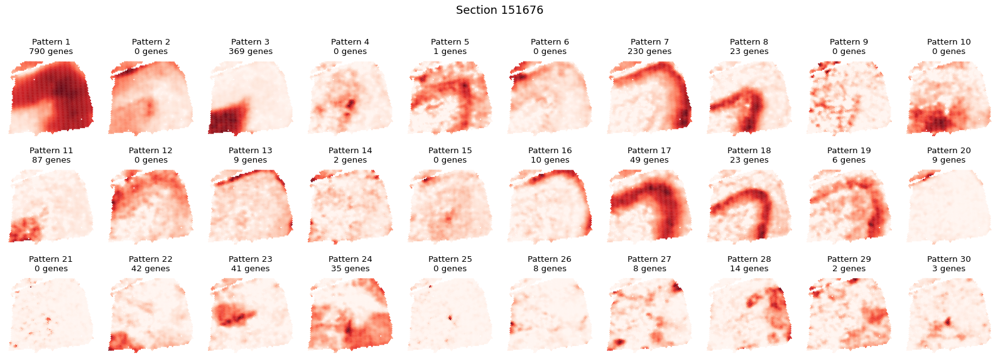

In [22]:
# Visualize patterns across all sections  
sim_slt = separ.sim_res(separ.Wpn, separ.Hpn, separ.Xt.T)  
sim_argsort = np.argsort(-sim_slt)  

num_patterns = 30  
for j, adata in enumerate(separ.adata_list):  
    batch_name = str(151673 + j)  
    loc = adata.obsm['spatial']  
    
    plt.figure(dpi=80, figsize=(20, 7))  
    for i in range(30):  
        ii = sim_argsort[i]  
        plt.subplot(3, np.int(num_patterns/3), i + 1)  
        
        # Get indices for current section  
        batch_indices = separ.adata_concat.obs['batch_name'] == batch_name  
        
        plt.scatter(  
            loc[:, 0],   
            -loc[:, 1],  
            c=separ.Wpn[batch_indices, ii].reshape(-1, 1),  
            s=1.2,   
            cmap='Reds'  
        )  
        plt.axis('off')  
        plt.title(  
            f'Pattern {i + 1}\n{int(separ.genes_per_pattern[ii])} genes',  
            fontsize=12  
        )  
    plt.suptitle(f'Section {batch_name}', fontsize=16, y=1.02)  
    plt.tight_layout()  
    plt.show()  

In [21]:
# Create comprehensive pattern-gene table  
print("\nPattern Analysis Summary (Sorted by Pattern Significance):")  
print("-" * 120)  
print(f"{'Pattern':8} | {'Significance':11} | {'#Genes':8} | {'Top Genes'}")  
print("-" * 120)  


# Print detailed pattern information  
for rank, pattern_idx in enumerate(sim_argsort[:30]):  
    genes = pattern_genes[pattern_idx]  
    if len(genes) == 0:  
        gene_str = "None"  
    else:  
        gene_str = ", ".join(genes[:5])  
        if len(genes) > 5:  
            gene_str += "..."  
    
    print(  
        f"Pattern {rank+1:<2} | "  
        f"{sim_slt[pattern_idx]:.4f}      | "  
        f"{len(genes):<8} | "   
        f"{gene_str}"  
    )  
print("-" * 120)  


Pattern Analysis Summary (Sorted by Pattern Significance):
------------------------------------------------------------------------------------------------------------------------
Pattern  | Significance | #Genes   | Top Genes
------------------------------------------------------------------------------------------------------------------------
Pattern 1  | 0.9283      | 790      | BEX1, TPI1, SNRPN, SNAP25, MDH1...
Pattern 2  | 0.8234      | 0        | None
Pattern 3  | 0.8032      | 369      | AC096564.1, AQP1, LPAR1, MOBP, CTNNA3...
Pattern 4  | 0.7088      | 0        | None
Pattern 5  | 0.7042      | 1        | HEPN1
Pattern 6  | 0.6815      | 0        | None
Pattern 7  | 0.6577      | 230      | FREM3, LINC02552, CALB1, CARTPT, CUX2...
Pattern 8  | 0.6533      | 23       | THEMIS, OLFML2B, SEMA3E, SMIM32, NR4A2...
Pattern 9  | 0.6470      | 0        | None
Pattern 10 | 0.6413      | 0        | None
Pattern 11 | 0.6405      | 87       | TP53TG5, DNAH17, CAHM, SLC35D2, NINJ2...
Pa

## Spatially Variable Genes (SVGs) Analysis


In [ ]:
# Identify spatially variable genes  
svg_results = separ.recognize_svgs(err_tol=0.5)  

# Extract results  
svgs = svg_results['svgs']  
gene_ranking = svg_results['gene_ranking']  
error_rates = svg_results['error_rates']  

print(f"Number of SVGs identified: {len(svgs)}") 

### Visualizing Spatially Variable Genes  

Let's visualize some examples of the most and least spatially variable genes across sections:  

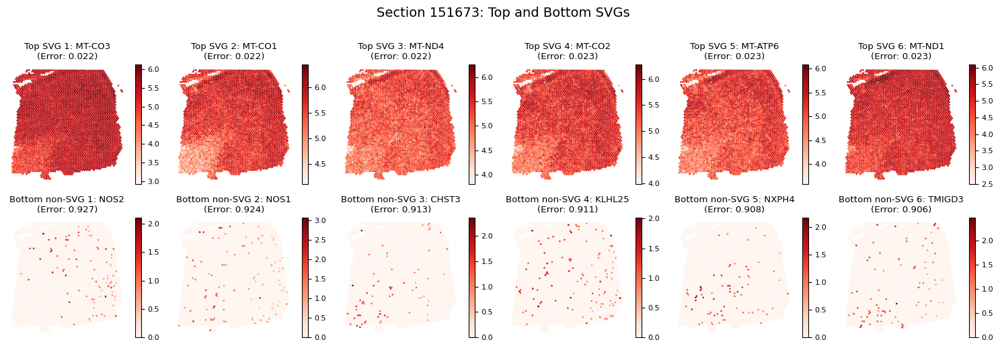

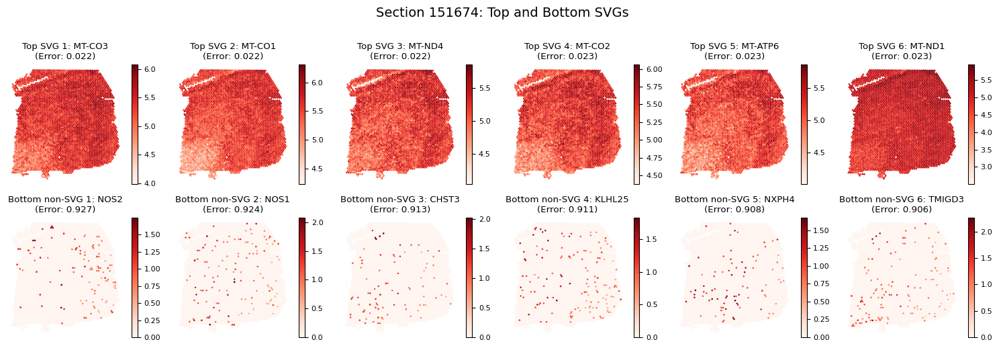

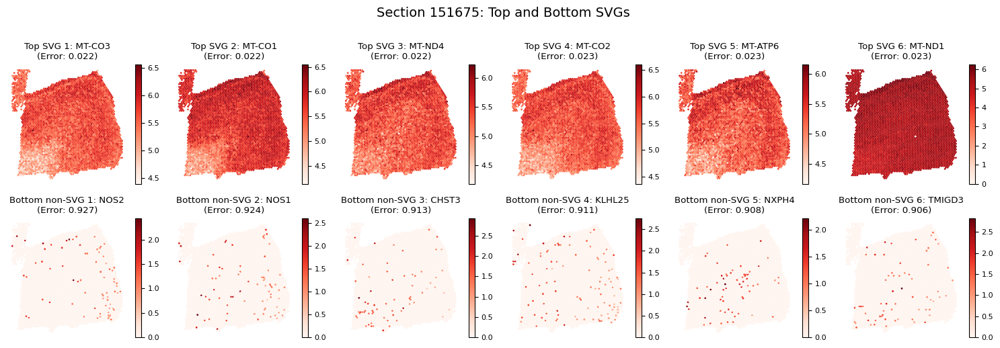

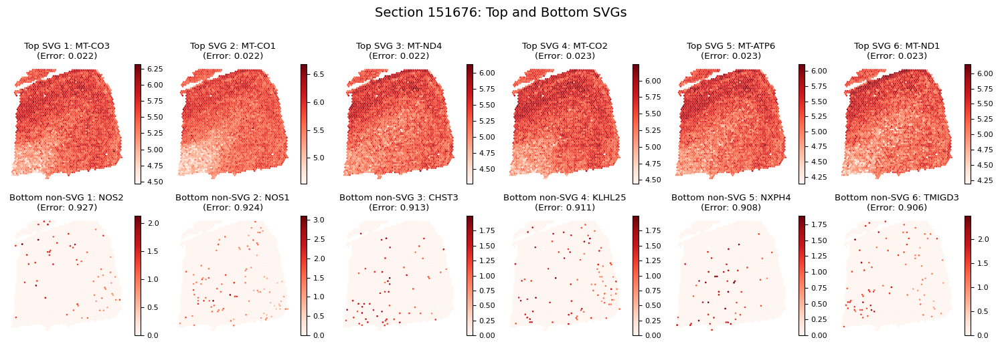

In [28]:
# Visualize SVGs for each section  
for j, adata in enumerate(separ.adata_list):  
    batch_name = str(151673 + j)  
    loc = adata.obsm['spatial']  
    
    plt.figure(figsize=(15, 5), dpi=100)  
    plt.suptitle(f'Section {batch_name}: Top and Bottom SVGs', y=1.02, fontsize=14)  
    plt.rcParams['font.size'] = 8  

    # Plot top 6 SVGs  
    for i in range(6):  
        plt.subplot(2, 6, i+1)  
        gene_idx = gene_ranking[i]  
        gene_name = separ.adata_concat.var_names[gene_idx]  
        gene_exp = adata[:, gene_idx].X.toarray().flatten()  
        
        scatter = plt.scatter(  
            loc[:, 0],  
            -loc[:, 1],  
            c=gene_exp,  
            s=1,  
            cmap='Reds'  
        )  
        plt.title(f'Top SVG {i+1}: {gene_name}\n(Error: {error_rates[gene_idx]:.3f})')  
        plt.axis('off')  
        plt.colorbar(scatter)  

    # Plot bottom 6 non-SVGs  
    for i in range(6):  
        plt.subplot(2, 6, i+7)  
        gene_idx = gene_ranking[-(i+1)]  
        gene_name = separ.adata_concat.var_names[gene_idx]  
        gene_exp = adata[:, gene_idx].X.toarray().flatten()  
        
        scatter = plt.scatter(  
            loc[:, 0],  
            -loc[:, 1],  
            c=gene_exp,  
            s=1,  
            cmap='Reds'  
        )  
        plt.title(f'Bottom non-SVG {i+1}: {gene_name}\n(Error: {error_rates[gene_idx]:.3f})')  
        plt.axis('off')  
        plt.colorbar(scatter)  

    plt.tight_layout()  
    plt.show()  

## Gene Expression Refinement

In [29]:
# Get refined expression data  
adata_refined = separ.get_refined_expression()  

### Single Gene Visualization

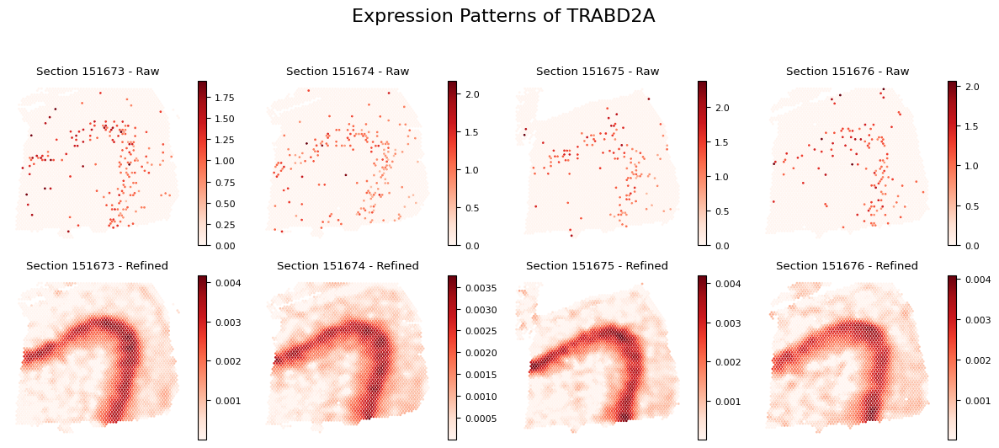

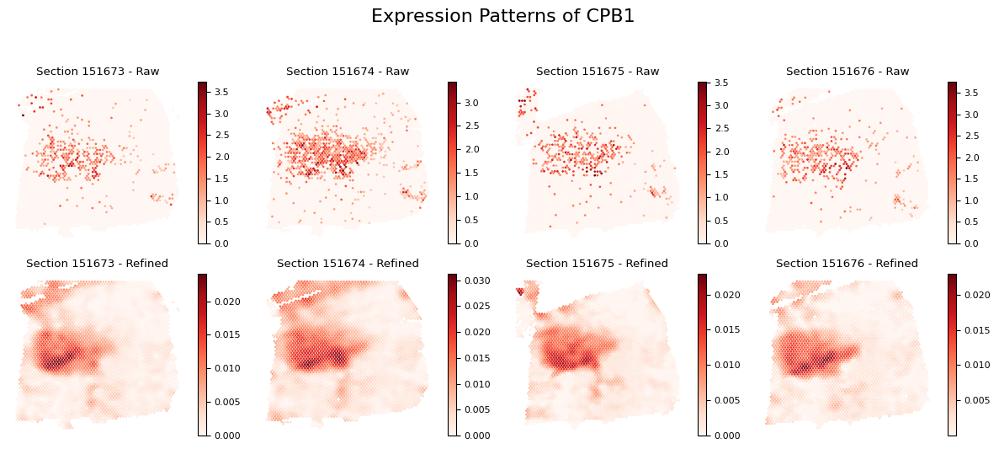

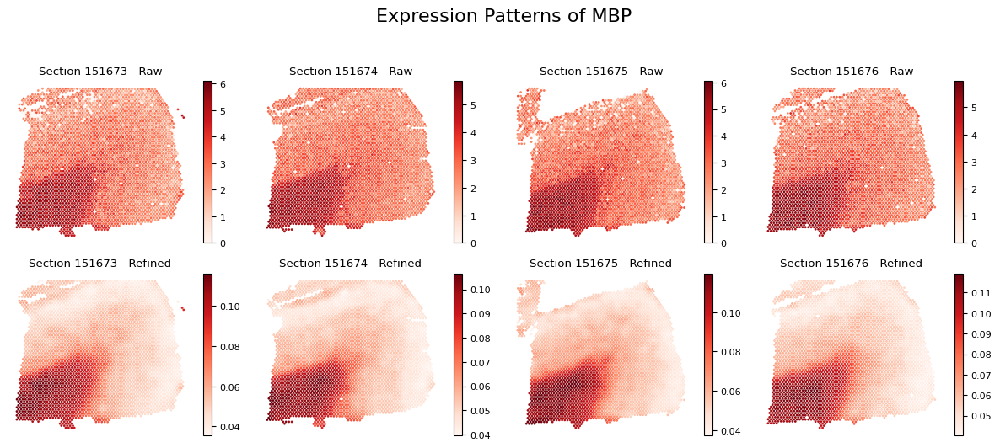

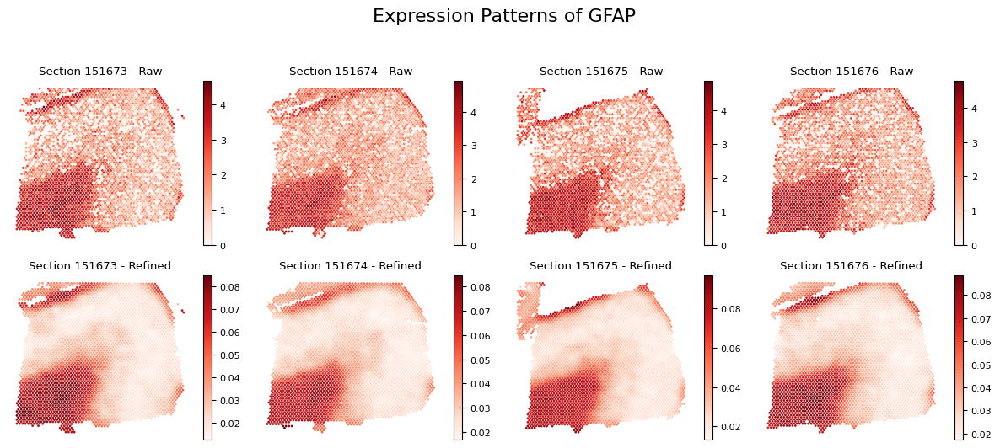

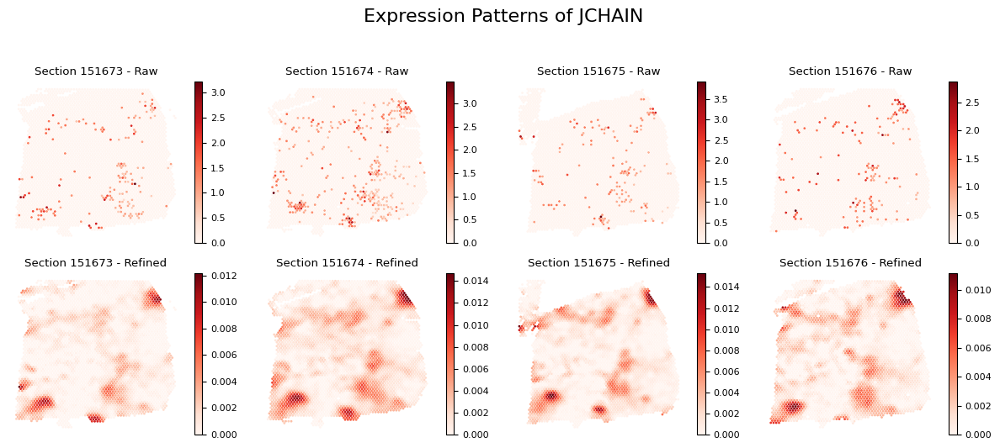

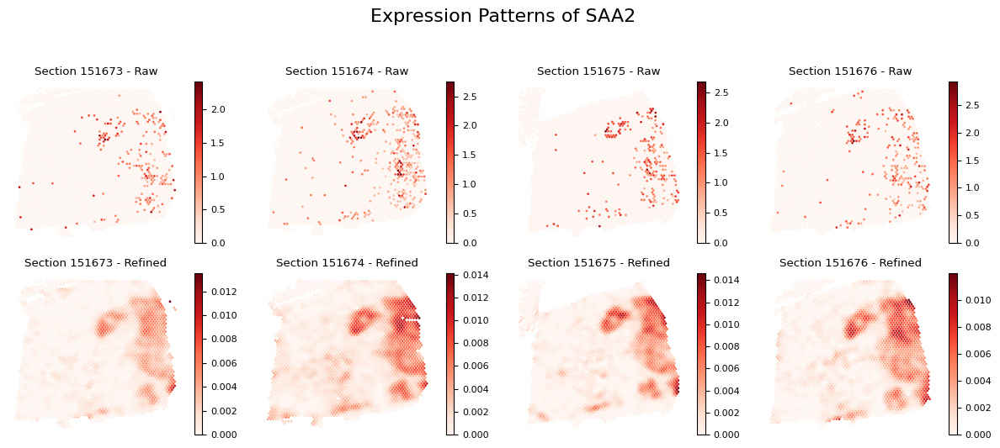

In [37]:
def plot_gene_refinement_multi(gene_name, separ, adata_refined):  
    """  
    Visualize raw and refined expression patterns across all sections.  
    """  
    plt.figure(figsize=(12, 5))  
    plt.suptitle(f'Expression Patterns of {gene_name}', fontsize=16, y=1.05)  
    
    for i, adata in enumerate(separ.adata_list):  
        batch_name = str(151673 + i)  
        batch_mask = separ.adata_concat.obs['batch_name'] == batch_name  
        loc = adata.obsm['spatial']  
        
        # Get gene expression values  
        gene_idx = adata.var_names.get_loc(gene_name)  
        raw_exp = adata[:, gene_idx].X.toarray().flatten()  
        refined_exp = adata_refined[batch_mask, gene_idx].X  
        
        # Plot raw expression  
        plt.subplot(2, 4, i + 1)  
        scatter = plt.scatter(  
            loc[:, 0],  
            -loc[:, 1],  
            c=raw_exp,  
            s=1,  
            cmap='Reds',  
            rasterized=True  
        )  
        plt.axis('off')  
        plt.title(f'Section {batch_name} - Raw')  
        plt.colorbar(scatter)  
        
        # Plot refined expression  
        plt.subplot(2, 4, i + 5)  
        scatter = plt.scatter(  
            loc[:, 0],  
            -loc[:, 1],  
            c=refined_exp,  
            s=1,  
            cmap='Reds',  
            rasterized=True  
        )  
        plt.axis('off')  
        plt.title(f'Section {batch_name} - Refined')  
        plt.colorbar(scatter)  
    
    plt.tight_layout()  
    plt.show()  

# Visualize example genes  
example_genes = ["TRABD2A","CPB1", "MBP", "GFAP", "JCHAIN", "SAA2"]  
for gene in example_genes:  
    plot_gene_refinement_multi(gene, separ, adata_refined)  
    

## Performing Clustering

In [ ]:
# Perform clustering  
labels = separ.clustering(  
    n_cluster=7,       # Number of spatial domains  
    N1=13,     # Range for norm-based filtering  
    N2=5       # Range for similarity-based filtering  
)  


# Distribute clustering results back to individual sections  
clustering_results = separ.adata_concat.obs['clustering']  
batch_info = separ.adata_concat.obs['batch_name']  

for i, adata in enumerate(separ.adata_list):  
    # Get batch name for current section  
    batch_name = str(151673 + i)  
    
    # Extract cells belonging to current section  
    section_cells = batch_info[batch_info == batch_name].index  
    
    # Get clustering results for current section  
    section_clustering = clustering_results.loc[section_cells]  
    
    # Store clustering results in original AnnData object  
    adata.obs['clustering'] = section_clustering  

# Calculate clustering accuracy (if ground truth available)  
from sklearn.metrics import adjusted_rand_score  
ARI_list = []  
for bb in range(4):  
    ARI = adjusted_rand_score(  
        Batch_list[bb].obs['Ground Truth'],   
        Batch_list[bb].obs['clustering']  
    )  
    ARI_list.append(round(ARI, 2))  
print("ARI scores for each section:", ARI_list)

ARI scores for each section: [0.58, 0.56, 0.53, 0.53]


### Clustering Results Visualization

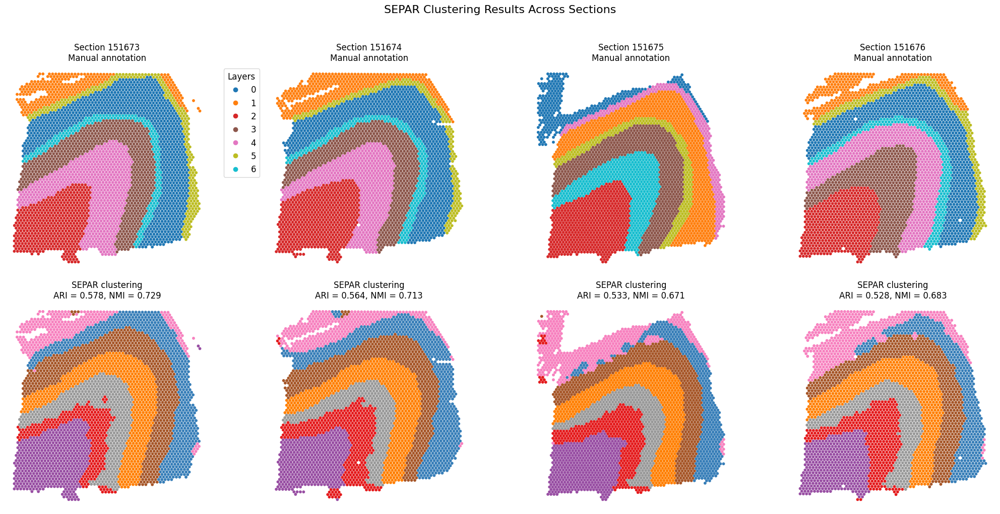


Metrics for each section:
--------------------------------------------------
Section    | ARI        | NMI       
--------------------------------------------------
151673     |      0.578 |      0.729
151674     |      0.564 |      0.713
151675     |      0.533 |      0.671
151676     |      0.528 |      0.683


In [43]:
from sklearn.metrics.cluster import normalized_mutual_info_score
# Calculate ARI and NMI scores for each section  
ARI_list = []  
NMI_list = []  
for i, adata in enumerate(separ.adata_list):  
    ARI = adjusted_rand_score(  
        adata.obs['Ground Truth'],  
        adata.obs['clustering']  
    )  
    NMI = normalized_mutual_info_score(  
        adata.obs['Ground Truth'],  
        adata.obs['clustering']  
    )  
    ARI_list.append(ARI)  
    NMI_list.append(NMI)  

# Create visualization with 2x4 subplots  
fig, axs = plt.subplots(2, 4, figsize=(20, 10), dpi=100)  
plt.rcParams['font.size'] = 12  

for i, adata in enumerate(separ.adata_list):  
    batch_name = str(151673 + i)  
    loc = adata.obsm['spatial']  
    
    # Ground truth plot (top row)  
    groups = adata.obs['Ground Truth'].astype('str')  
    unique_regions = groups.unique()  
    region_to_num = {region: num for num, region in enumerate(unique_regions)}  
    groups = adata.obs['Ground Truth'].map(region_to_num)  
    
    scatter = axs[0, i].scatter(  
        loc[:, 0],  
        -loc[:, 1],  
        c=groups,  
        s=10,  
        cmap='tab10'  
    )  
    axs[0, i].set_title(f"Section {batch_name}\nManual annotation", fontsize=12)  
    axs[0, i].axis('off')  
    
    # Add legend to the first plot only  
    if i == 0:  
        legend = axs[0, i].legend(  
            *scatter.legend_elements(),  
            title="Layers",  
            bbox_to_anchor=(1.05, 1),  
            loc='upper left'  
        )  
    
    # SEPAR clustering plot (bottom row)  
    cluster_labels = adata.obs['clustering'].astype(int).values  
    
    scatter = axs[1, i].scatter(  
        loc[:, 0],  
        -loc[:, 1],  
        c=cluster_labels,  
        s=10,  
        cmap='Set1'  
    )  
    
    axs[1, i].set_title(  
        f"SEPAR clustering\nARI = {ARI_list[i]:.3f}, NMI = {NMI_list[i]:.3f}",  
        fontsize=12  
    )  
    axs[1, i].axis('off')  

plt.suptitle('SEPAR Clustering Results Across Sections', fontsize=16, y=1.02)  
plt.tight_layout()  
plt.show()  

print("\nMetrics for each section:")  
print("-" * 50)  
print(f"{'Section':10} | {'ARI':10} | {'NMI':10}")  
print("-" * 50)  
for i in range(len(ARI_list)):  
    print(f"{151673+i:<10} | {ARI_list[i]:10.3f} | {NMI_list[i]:10.3f}")